In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sn

In [2]:
import os

In [3]:
os.listdir(r"C:\Users\HP\Downloads\Uber\Datasets")

['other-American_B01362.csv',
 'other-Carmel_B00256.csv',
 'other-Dial7_B00887.csv',
 'other-Diplo_B01196.csv',
 'other-Federal_02216.csv',
 'other-FHV-services_jan-aug-2015.csv',
 'other-Firstclass_B01536.csv',
 'other-Highclass_B01717.csv',
 'other-Lyft_B02510.csv',
 'other-Prestige_B01338.csv',
 'other-Skyline_B00111.csv',
 'Uber-Jan-Feb-FOIL.csv',
 'uber-raw-data-apr14.csv',
 'uber-raw-data-aug14.csv',
 'uber-raw-data-janjune-15.csv',
 'uber-raw-data-janjune-15_sample.csv',
 'uber-raw-data-jul14.csv',
 'uber-raw-data-jun14.csv',
 'uber-raw-data-may14.csv',
 'uber-raw-data-sep14.csv']

In [4]:
uber_15 = pd.read_csv(r"C:\Users\HP\Downloads\Uber\Datasets/uber-raw-data-janjune-15_sample.csv")
uber_15

,Dispatching_base_num,Pickup_date,Affiliated_base_num,locationID
0,B02617,2015-05-02 21:43:00,B02764,237
1,B02682,2015-01-20 19:52:59,B02682,231
2,B02617,2015-03-19 20:26:00,B02617,161
3,B02764,2015-04-10 17:38:00,B02764,107
4,B02764,2015-03-23 07:03:00,B00111,140
...,...,...,...,...
99995,B02764,2015-04-13 16:12:00,B02764,234
99996,B02764,2015-03-06 21:32:00,B02764,24
99997,B02598,2015-03-19 19:56:00,B02598,17
99998,B02682,2015-05-02 16:02:00,B02682,68


In [5]:
uber_15.shape

(100000, 4)

Data Pre-processing/Data Cleaning

In [6]:
uber_15.duplicated().sum()

54

In [7]:
uber_15.drop_duplicates(inplace=True)
uber_15.shape

(99946, 4)

In [8]:
uber_15.dtypes

Dispatching_base_num    object
Pickup_date             object
Affiliated_base_num     object
locationID               int64
dtype: object

In [9]:
uber_15.isnull().sum()

Dispatching_base_num       0
Pickup_date                0
Affiliated_base_num     1116
locationID                 0
dtype: int64

In [10]:
uber_15.dropna(inplace=True)

In [11]:
uber_15.isna().sum()

Dispatching_base_num    0
Pickup_date             0
Affiliated_base_num     0
locationID              0
dtype: int64

In [12]:
uber_15['Pickup_date'] = pd.to_datetime(uber_15['Pickup_date'])

In [13]:
type(uber_15['Pickup_date'])

pandas.core.series.Series

In [14]:
uber_15.dtypes

Dispatching_base_num            object
Pickup_date             datetime64[ns]
Affiliated_base_num             object
locationID                       int64
dtype: object

In [15]:
 uber_15.shape

(98830, 4)

Analysing which month have max Uber Pickups?

<Axes: >

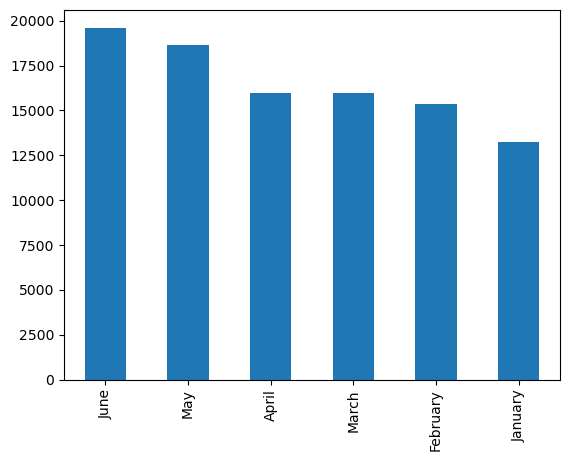

In [16]:
uber_15['Month'] = uber_15['Pickup_date'].dt.month_name()
uber_15['Month'].value_counts().plot(kind='bar')

In [17]:
uber_15['Weekday'] = uber_15['Pickup_date'].dt.day_name()
uber_15['day'] = uber_15['Pickup_date'].dt.day
uber_15['Hour'] = uber_15['Pickup_date'].dt.hour
uber_15['Minute'] = uber_15['Pickup_date'].dt.minute
uber_15.head()

,Dispatching_base_num,Pickup_date,Affiliated_base_num,locationID,Month,Weekday,day,Hour,Minute
0,B02617,2015-05-02 21:43:00,B02764,237,May,Saturday,2,21,43
1,B02682,2015-01-20 19:52:59,B02682,231,January,Tuesday,20,19,52
2,B02617,2015-03-19 20:26:00,B02617,161,March,Thursday,19,20,26
3,B02764,2015-04-10 17:38:00,B02764,107,April,Friday,10,17,38
4,B02764,2015-03-23 07:03:00,B00111,140,March,Monday,23,7,3


<Axes: xlabel='Month'>

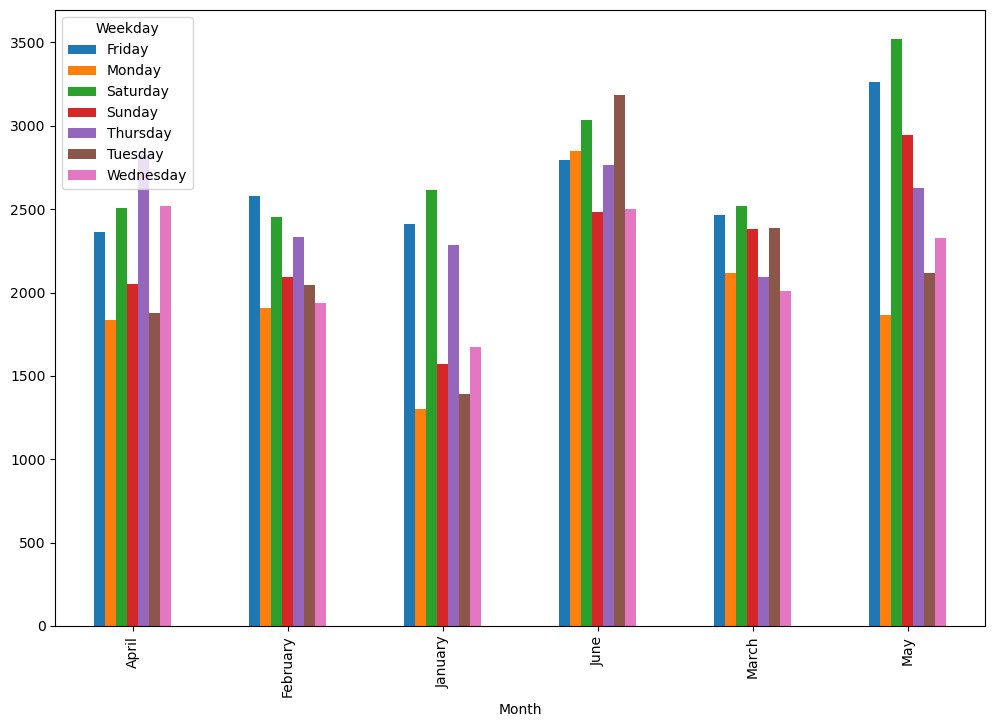

In [18]:
Weekday_over_Month = pd.crosstab(index=uber_15['Month'], columns=uber_15['Weekday'])
Weekday_over_Month.plot(kind='bar', figsize=(12,8))

<Axes: xlabel='Month', ylabel='count'>

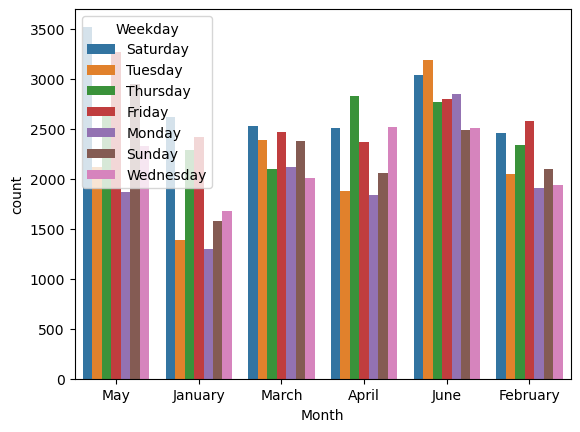

In [19]:
sn.countplot(data=uber_15, x = 'Month', hue= 'Weekday')

Analysing Hourly Rush in New York

<Axes: xlabel='Hour', ylabel='size'>

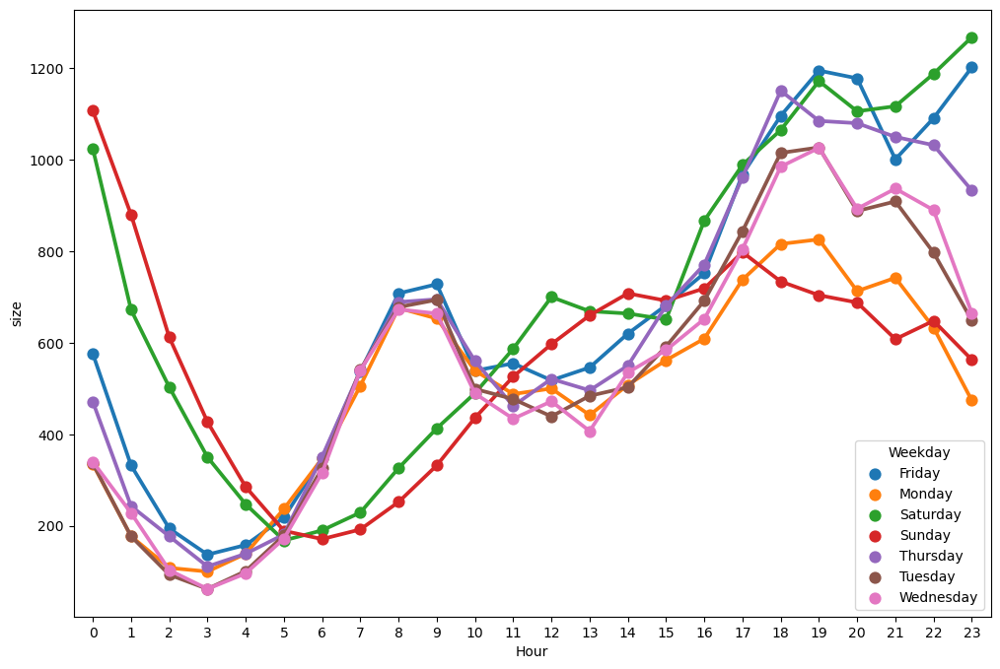

In [20]:
Weekday_over_hours = uber_15.groupby(['Weekday','Hour'], as_index=False).size()
plt.figure(figsize=(12,8))
sn.pointplot(data=Weekday_over_hours, x = 'Hour', y = 'size', hue = 'Weekday')

Analysing most active uber Base-Number

In [21]:
os.listdir(r"C:\Users\HP\Downloads\Uber\Datasets")

['other-American_B01362.csv',
 'other-Carmel_B00256.csv',
 'other-Dial7_B00887.csv',
 'other-Diplo_B01196.csv',
 'other-Federal_02216.csv',
 'other-FHV-services_jan-aug-2015.csv',
 'other-Firstclass_B01536.csv',
 'other-Highclass_B01717.csv',
 'other-Lyft_B02510.csv',
 'other-Prestige_B01338.csv',
 'other-Skyline_B00111.csv',
 'Uber-Jan-Feb-FOIL.csv',
 'uber-raw-data-apr14.csv',
 'uber-raw-data-aug14.csv',
 'uber-raw-data-janjune-15.csv',
 'uber-raw-data-janjune-15_sample.csv',
 'uber-raw-data-jul14.csv',
 'uber-raw-data-jun14.csv',
 'uber-raw-data-may14.csv',
 'uber-raw-data-sep14.csv']

In [22]:
uber_foil = pd.read_csv(r"C:\Users\HP\Downloads\Uber\Datasets/Uber-Jan-Feb-FOIL.csv")
uber_foil

,dispatching_base_number,date,active_vehicles,trips
0,B02512,1/1/2015,190,1132
1,B02765,1/1/2015,225,1765
2,B02764,1/1/2015,3427,29421
3,B02682,1/1/2015,945,7679
4,B02617,1/1/2015,1228,9537
...,...,...,...,...
349,B02764,2/28/2015,3952,39812
350,B02617,2/28/2015,1372,14022
351,B02682,2/28/2015,1386,14472
352,B02512,2/28/2015,230,1803


<Axes: xlabel='dispatching_base_number'>

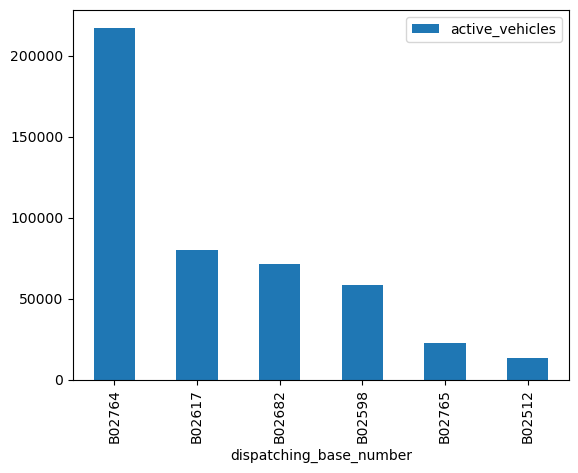

In [23]:
uber_foil.groupby(['dispatching_base_number'])[['active_vehicles']].sum().sort_values(by='active_vehicles', ascending=False
                                                                                     ).plot(kind='bar')

In [24]:
import plotly.express as px

In [25]:
px.box(data_frame=uber_foil, x = 'dispatching_base_number', y = 'active_vehicles')

Lets collect the entire data! Data Collection

In [29]:
files = os.listdir(r"C:\Users\HP\Downloads\Uber\Datasets")[-8:]
files.remove( 'uber-raw-data-janjune-15_sample.csv')
files.remove('uber-raw-data-janjune-15.csv')
files

['uber-raw-data-apr14.csv',
 'uber-raw-data-aug14.csv',
 'uber-raw-data-jul14.csv',
 'uber-raw-data-jun14.csv',
 'uber-raw-data-may14.csv',
 'uber-raw-data-sep14.csv']

In [30]:
final = pd.DataFrame()

path = r"C:\Users\HP\Downloads\Uber\Datasets"

for file in files:
    current_file = pd.read_csv(path+'/'+file)
    final = pd.concat([current_file,final])

In [32]:
final.shape

(4534327, 4)

In [33]:
final.duplicated().sum()

82581

In [34]:
final.drop_duplicates(inplace=True)

In [35]:
final.shape

(4451746, 4)

In [37]:
final.head()

,Date/Time,Lat,Lon,Base
0,9/1/2014 0:01:00,40.2201,-74.0021,B02512
1,9/1/2014 0:01:00,40.7500,-74.0027,B02512
2,9/1/2014 0:03:00,40.7559,-73.9864,B02512
3,9/1/2014 0:06:00,40.7450,-73.9889,B02512
4,9/1/2014 0:11:00,40.8145,-73.9444,B02512


Spatial Analysis to find the ruch of pickup

In [40]:
Rush_uber = final.groupby(['Lat','Lon'], as_index=False).size()
Rush_uber.head(5)

,Lat,Lon,size
0,39.6569,-74.2258,1
1,39.6686,-74.1607,1
2,39.7214,-74.2446,1
3,39.8416,-74.1512,1
4,39.9055,-74.0791,1


In [41]:
import folium

In [43]:
basemap = folium.Map()
basemap

In [44]:
from folium.plugins import HeatMap

In [46]:
HeatMap(Rush_uber).add_to(basemap)

In [47]:
basemap

Perform Pair-wise Analysis to figure out the rush

In [50]:
final.dtypes

Date/Time     object
Lat          float64
Lon          float64
Base          object
dtype: object

In [54]:
final['Date/Time'] = pd.to_datetime(final['Date/Time'])

In [55]:
final.dtypes

Date/Time    datetime64[ns]
Lat                 float64
Lon                 float64
Base                 object
dtype: object

In [64]:
final['Day'] = final['Date/Time'].dt.day
final['Hour'] = final['Date/Time'].dt.hour
final.drop('Month', axis=1, inplace=True)

In [65]:
final.head()

,Date/Time,Lat,Lon,Base,Hour,Day
0,2014-09-01 00:01:00,40.2201,-74.0021,B02512,0,1
1,2014-09-01 00:01:00,40.7500,-74.0027,B02512,0,1
2,2014-09-01 00:03:00,40.7559,-73.9864,B02512,0,1
3,2014-09-01 00:06:00,40.7450,-73.9889,B02512,0,1
4,2014-09-01 00:11:00,40.8145,-73.9444,B02512,0,1


In [69]:
pivot = final.groupby(['Hour','Day']).size().unstack().style.background_gradient()
pivot

Day,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31
Hour,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0,3178,2435,3354,2897,2733,4537,3645,2830,2657,3296,3036,3227,5408,3748,2497,2547,3155,3390,3217,4475,4294,2787,2546,3200,2405,3810,5196,4123,2678,2401,2174
1,1944,1569,2142,1688,1541,2864,2296,1646,1724,2126,1665,2147,3509,2349,1515,1585,2048,2135,2188,3190,3194,1637,1580,2055,1499,3065,3635,2646,1827,1510,1394
2,1256,1087,1407,1199,1030,1864,1507,1123,1222,1464,1095,1393,2262,1605,1087,1119,1500,1332,1604,2100,1972,1175,1136,1438,1072,2046,2352,1843,1409,1112,1087
3,1308,1414,1467,1424,1253,1555,1597,1483,1480,1434,1424,1362,1832,1656,1381,1395,1488,1626,1675,1858,1727,1468,1429,1493,1439,1806,2055,1802,1678,1403,919
4,1429,1876,1550,1696,1617,1551,1763,1889,1871,1591,1842,1757,1705,1756,1862,1818,1897,1892,1810,1618,1926,1934,1957,1798,1943,1730,1723,1883,1948,1841,773
5,2126,2812,2387,2581,2900,2162,2422,3224,3168,2594,2520,2710,2327,2629,2980,2966,2741,2959,2639,2143,2615,3151,3132,2754,2973,2337,2336,2793,3056,3216,997
6,3664,4920,4241,4592,4814,3642,4102,5431,5802,4664,4954,4576,4196,4257,5050,5558,4562,4688,4733,3584,4185,5204,5204,4484,5356,3776,3539,4290,5213,5757,1561
7,5380,6544,5663,6029,6261,4766,5575,7361,7592,6046,6876,6250,5685,5781,6837,7517,6315,6618,6159,4900,5727,6872,6890,6013,7627,5172,4937,5715,6852,7596,2169
8,5292,6310,5386,5704,6469,4942,5376,7357,7519,6158,6871,6231,6060,5520,6729,7495,5882,6451,6014,5083,5529,6850,6436,5913,7078,5071,5053,5671,6695,7611,2410


<Axes: xlabel='Day', ylabel='Hour'>

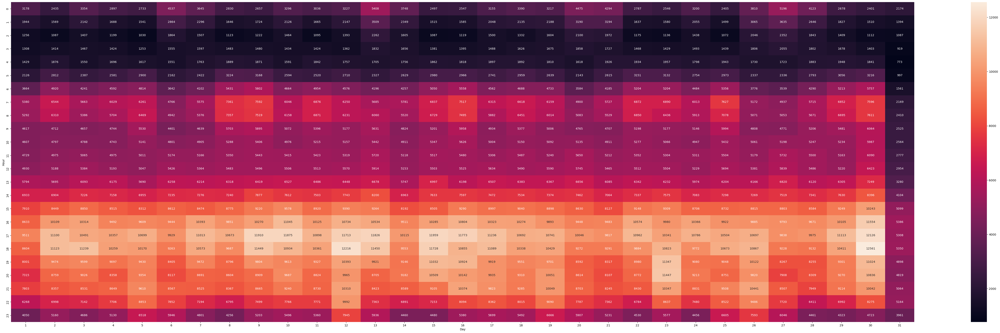

In [87]:
final.groupby(['Hour','Day'], as_index=True).size().unstack()
plt.figure(figsize=(70,20))
sn.heatmap(final.groupby(['Hour','Day'], as_index=True).size().unstack(),annot=True, fmt="d")

In [92]:
def gen_pivot_table( df, col1, col2):
    pivot = final.groupby([col1, col2]).size().unstack()
    return pivot.style.background_gradient()

gen_pivot_table(final, 'Day', 'Hour')

Hour,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23
Day,,,,,,,,,,,,,,,,,,,,,,,,
1,3178,1944,1256,1308,1429,2126,3664,5380,5292,4617,4607,4729,4930,5794,6933,7910,8633,9511,8604,8001,7315,7803,6268,4050
2,2435,1569,1087,1414,1876,2812,4920,6544,6310,4712,4797,4975,5188,5695,6904,8449,10109,11100,11123,9474,8759,8357,6998,5160
3,3354,2142,1407,1467,1550,2387,4241,5663,5386,4657,4788,5065,5384,6093,7226,8850,10314,10491,11239,9599,9026,8531,7142,4686
4,2897,1688,1199,1424,1696,2581,4592,6029,5704,4744,4743,4975,5193,6175,7158,8515,9492,10357,10259,9097,8358,8649,7706,5130
5,2733,1541,1030,1253,1617,2900,4814,6261,6469,5530,5141,5011,5047,5690,6955,8312,9609,10699,10170,9430,9354,9610,8853,6518
6,4537,2864,1864,1555,1551,2162,3642,4766,4942,4401,4801,5174,5426,6258,7235,8612,9444,9929,9263,8405,8117,8567,7852,5946
7,3645,2296,1507,1597,1763,2422,4102,5575,5376,4639,4905,5166,5364,6214,7276,8474,10393,11013,10573,9472,8691,8525,7194,4801
8,2830,1646,1123,1483,1889,3224,5431,7361,7357,5703,5288,5350,5483,6318,7240,8775,9851,10673,9687,8796,8604,8367,6795,4256
9,2657,1724,1222,1480,1871,3168,5802,7592,7519,5895,5406,5443,5496,6419,7877,9220,10270,11910,11449,9804,8909,8665,7499,5203
